In [1]:
# This is a python test script that performs the following procedure:
# On a sample dataset ->
# Cluster with BIRCH and retrieve and store centroids as 'S'
# Retrieve cluster label for each sample and store as 'cluster_labels'
# Group samples by centroid and save to a matrix.
# Calculate the number of samples per centroid (N) and join to its respective
# centroid on a matrix.
# Cluster the centroids 'S' with HDBSCAN.
# Retrieve the cluster labels generated by HDBSCAN and match to their respective
# samples according to the centroid the sample is associated with on the original
# dataset.
# The script is influenced by the proposed BIRCHSCAN algorithm from de Moura Ventorim et al.
# However, it does not make use of 'weights' at the HDBSCAN step because centroids by definition
# take into account N and LS by way of the following relationship: C = LS/N
# Where N = Number of items in subclusters, and LS =  vector sum of the data points.
# Author: Julen Gamboa
# email: j.a.r.gamboa@gmail.com

In [33]:
import numpy as np
import pandas as pd
import hdbscan
from sklearn.cluster import Birch, DBSCAN
from sklearn.datasets import make_blobs
from time import time
import matplotlib.pyplot as plt
from plotnine import *

In [3]:
# Generate blobs
X, y = make_blobs(n_samples=50000, centers=104, random_state=0)

In [4]:
# Execute BIRCH algorithm on X
start_time = time()
brc = Birch(threshold=1.2, n_clusters=None)
brc.fit(X)
S = brc.subcluster_centers_
cluster_labels = brc.predict(X)
print(f"Time taken to execute BIRCH: {time() - start_time:.4f} seconds")

Time taken to execute BIRCH: 0.9873 seconds


In [5]:
# Get cluster labels for each sample
cluster_labels = brc.predict(X)

In [6]:
# Group samples by centroid and create a DataFrame
df_samples = pd.DataFrame(X, columns=[f"dim{i}" for i in range(X.shape[1])])
df_samples['cluster'] = cluster_labels

In [7]:
# Save clustered samples to a TSV file
df_samples.to_csv('00_BIRCH_clustered_samples.tsv', sep='\t', index=False)

In [8]:
# Retrieve the number of samples per centroid
Ns = df_samples['cluster'].value_counts().sort_index()

In [9]:
# Save subcluster centers and N as a DataFrame, input for HDBSCAN
df_subclusters = pd.DataFrame(S, columns=[f"dim{i}" for i in range(S.shape[1])])
df_subclusters['N'] = Ns.values
df_subclusters.to_csv('01_BIRCH_subclusters.tsv', sep='\t', index=False)

In [10]:
# Cluster the subcluster centers obtained from BIRCH with HDBSCAN
t = time()
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=5, metric='euclidean', cluster_selection_method='leaf', allow_single_cluster=True)
hdbscan_labels = hdbscan_model.fit_predict(S)
print("DBSCAN clustering took %0.2f seconds" % (time() - t))

DBSCAN clustering took 0.01 seconds


In [11]:
# Save HDBSCAN results to a TSV file
df_hdbscan = pd.DataFrame({'subcluster_index': np.arange(len(S)), 'hdbscan_label': hdbscan_labels})
df_hdbscan.to_csv('02_hdbscan_results.tsv', sep='\t', index=False)

In [12]:
# Merge HDBSCAN results with BIRCH results
df_merged = df_samples.merge(df_hdbscan, left_index=True, right_on='subcluster_index', how='inner')

In [13]:
# Retrieve the labels from DBSCAN clustering
hdbscan_labels = hdbscan_model.labels_

In [14]:
# Create a DataFrame with DBSCAN results
df_hdbscan = pd.DataFrame({'subcluster_index': np.arange(len(S)), 'dbscan_label': hdbscan_labels})

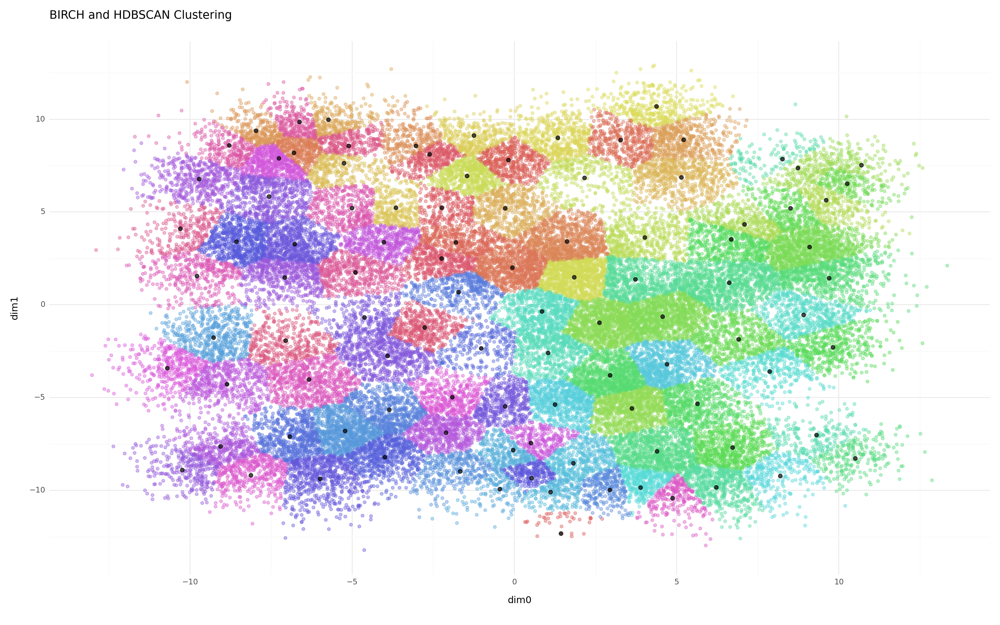

<Figure Size: (1600 x 1000)>

In [20]:
# Plot BIRCH and HDBSCAN results
df_samples_plot = pd.DataFrame(X, columns=["dim0", "dim1"])
df_samples_plot['cluster'] = cluster_labels
df_hdbscan_plot = pd.DataFrame(S, columns=["dim0", "dim1"])
df_hdbscan_plot['hdbscan_label'] = hdbscan_labels

(ggplot(df_samples_plot, aes(x="dim0", y="dim1", color="factor(cluster)")) +
 geom_point(alpha=0.4) +
 theme_minimal() +
 geom_point(df_hdbscan_plot, aes(x="dim0", y="dim1"), color='black', size=2, alpha = 0.7) +
 labs(title='BIRCH and HDBSCAN Clustering') +
 theme(legend_position="none", figure_size=(16, 10)))

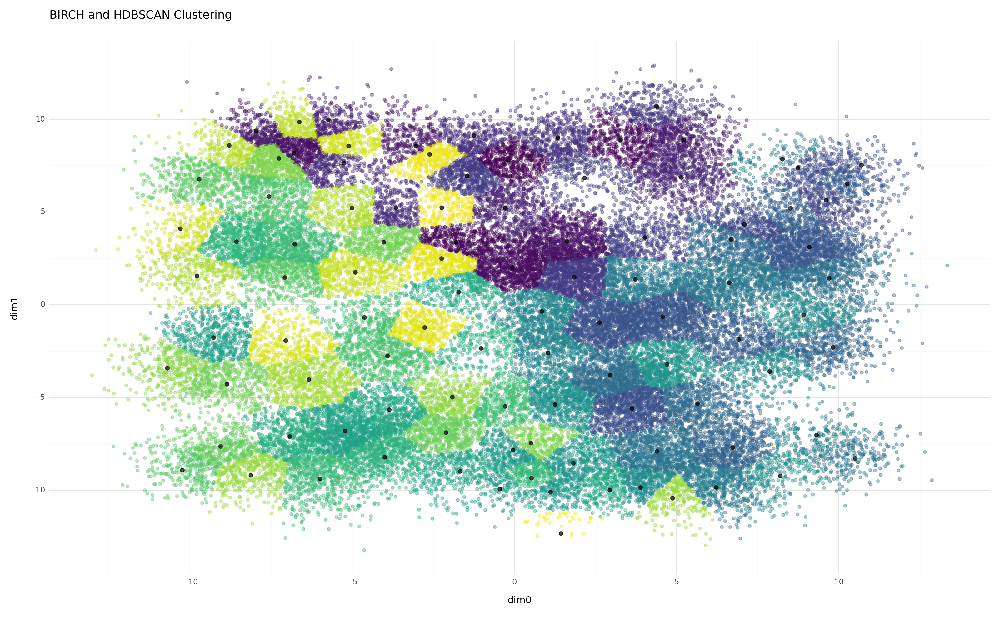

<Figure Size: (1600 x 1000)>

In [43]:
# Generate a continuous colormap similar to "viridis" for 101 values
num_values = len(hdbscan_labels)
cmap = plt.cm.viridis
colors = [cmap(i / num_values) for i in range(num_values)]

# Convert colors to hex format
color_scale = [f'#{int(r * 255):02x}{int(g * 255):02x}{int(b * 255):02x}' for r, g, b, _ in colors]

(ggplot(df_samples_plot, aes(x="dim0", y="dim1", color="factor(cluster)")) +
 geom_point(alpha=0.4) +
 geom_point(df_hdbscan_plot, aes(x="dim0", y="dim1"), color='black', size=2, alpha=0.7) +
 scale_color_manual(values=color_scale) +  # Use the custom continuous colormap
 labs(title='BIRCH and HDBSCAN Clustering') +
 theme_minimal() +
 theme(legend_position="none", figure_size=(16, 10)))

In [48]:
p = (ggplot(df_samples_plot, aes(x="dim0", y="dim1", color="factor(cluster)")) +
 geom_point(alpha=0.3) +
 geom_point(df_hdbscan_plot, aes(x="dim0", y="dim1"), color='black', size=2, alpha=0.7) +
 scale_color_manual(values=color_scale) +  # Use the custom continuous colormap
 labs(title='BIRCH and HDBSCAN Clustering') +
 theme_minimal() +
 theme(legend_position="none", figure_size=(16, 10)))

In [49]:
# Save the plot to a PNG file
output_filename = "birch_hdbscan_plot.png"
p.save(output_filename, dpi=600)
print(f"Plot saved to '{output_filename}'")

/home/jgamboa/anaconda3/lib/python3.10/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 10 in image.
/home/jgamboa/anaconda3/lib/python3.10/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: birch_hdbscan_plot.png


Plot saved to 'birch_hdbscan_plot.png'


In [50]:
# And to a JPG file
output_filename = "birch_hdbscan_plot.jpg"
p.save(output_filename, dpi=600)
print(f"Plot saved to '{output_filename}'")

/home/jgamboa/anaconda3/lib/python3.10/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 10 in image.
/home/jgamboa/anaconda3/lib/python3.10/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: birch_hdbscan_plot.jpg


Plot saved to 'birch_hdbscan_plot.jpg'
